## Notebook to score cells based on gene set

attempt to use this functionality for determing scores for
- disease associated microglia (DAM) 
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799
        - "DAM signature (Cst7, Csf1, Lpl, Apoe, Spp1, Cd74, Itgax)"
- senescence
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799?via%3Dihub
        - "custom senescence signature (Cdkn2a, Cdkn1a, Cdkn2d, Casp8, Il1b, Glb1, Serpine1)"
    - Tabula Muris Consortium. A single-cell transcriptomic atlas characterizes ageing tissues in the mouse. Nature 2020;583:590–5.
    https://pubmed.ncbi.nlm.nih.gov/32669714/
        - Canonical Senescence Pathway (ATM,BMI1,CCND1,CCNE1,CDK2,CDK4,CDK6,CDKN1A,CDKN2A,CDKN2D,CHEK1,CHEK2,E2F1,E2F3,ETS1,ETS2,MDM2,RB1,RBL2,SATB1,TP53,TWIST1)
        - Senescence Responses (AKT1,CALR,CCL2,CCL20,CCL5,CCL8,CD44,COL1A1,COL3A1,CSF2,CXCL1,CXCL2,CXCL5,CXCL8,FGF2,FGF7,FN1,GLB1,ICAM,IGFBP2,IGFBP4,IGFBP7,IL11,IL1A,IL1B,IL6,LIP,LMNB1,MMP1,MMP10,MMP12,MMP3,NFIA,PLAUR,PTEN,SPARC,SERPINB2,SERPINE1,TBX2,TBX3,TGFB1I1,THBS1\xca(TSP-1),TIMP1,TIMP2,TNF,VEGFA,VEGFB,VIM)
        - Senescence Initiators (ABL1,AKT1,ALDH1A3,CCNA2,CCNB1,CDC25C,CDKN1B,CDKN1C,CDKN2B,CDKN2C,CITED2,CREG1,EGR1,GADD45A,GSK3B,HRAS,ID1,IFNG,IGF1,IGF1R,IGFBP3,IGFBP5,IGFBP7,ING1,IRF3,IRF5,IRF7,MAP2K1,,MAP2K3,MAP2K6,MAPK14,MAPK14,MORC3,MYC,NBN,NFKB1,NOX4,PCNA,PIK3CA,PLAU,PRKCD,RBL1,SIRT1,SOD1,SOD2,TERF2,TERT,TGFB1,TP53BP1)
    


In [1]:
!date

Wed Oct 12 15:51:49 EDT 2022


#### import libraries

In [31]:
import scanpy as sc
from anndata import AnnData
from pandas import DataFrame
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from seaborn import scatterplot

%matplotlib inline
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings(action='ignore')

#### set notebook variables

In [3]:
# naming
project = 'aging'

# directories 
wrk_dir = f'/labshare/raph/datasets/adrd_neuro/{project}'
quants_dir = f'{wrk_dir}/demux'

# in files
in_file = f'{quants_dir}/{project}.pegasus.leiden_085.subclustered.h5ad'

# variables
DEBUG = True
dpi_value = 50
gene_sets = {'DAM': ['CST7', 'CSF1', 'LPL', 'APOE', 'SPP1', 'CD74', 'ITGAX'],
             'CSS': ['CDKN2A', 'CDKN1A', 'CDKN2D', 'CASO8', 'IL1B', 'GLB1', 'SERPINE1'],
             'CSP': ['ATM', 'BMI1', 'CCND1', 'CCNE1', 'CDK2', 'CDK4', 'CDK6', 
                     'CDKN1A', 'CDKN2A', 'CDKN2D', 'CHEK1', 'CHEK2', 'E2F1', 
                     'E2F3', 'ETS1', 'ETS2', 'MDM2', 'RB1', 'RBL2', 'SATB1', 
                     'TP53', 'TWIST1'],
             'SR': ['AKT1', 'CALR', 'CCL2', 'CCL20', 'CCL5', 'CCL8', 'CD44', 
                    'COL1A1', 'COL3A1', 'CSF2', 'CXCL1', 'CXCL2', 'CXCL5', 
                    'CXCL8', 'FGF2', 'FGF7', 'FN1', 'GLB1', 'ICAM', 'IGFBP2', 
                    'IGFBP4', 'IGFBP7', 'IL11', 'IL1A', 'IL1B', 'IL6', 'LIP',
                    'LMNB1', 'MMP1', 'MMP10', 'MMP12', 'MMP3', 'NFIA', 'PLAUR', 
                    'PTEN', 'SPARC', 'SERPINB2', 'SERPINE1', 'TBX2', 'TBX3', 
                    'TGFB1I1', 'THBS1\xca(TSP-1)', 'TIMP1', 'TIMP2', 'TNF', 
                    'VEGFA', 'VEGFB', 'VIM'],
             'SI': ['ABL1', 'AKT1', 'ALDH1A3', 'CCNA2', 'CCNB1', 'CDC25C', 
                    'CDKN1B', 'CDKN1C', 'CDKN2B', 'CDKN2C', 'CITED2', 'CREG1', 
                    'EGR1', 'GADD45A', 'GSK3B', 'HRAS', 'ID1', 'IFNG', 'IGF1', 
                    'IGF1R', 'IGFBP3', 'IGFBP5', 'IGFBP7', 'ING1', 'IRF3', 
                    'IRF5', 'IRF7', 'MAP2K1', 'MAP2K3', 'MAP2K6', 'MAPK14', 
                    'MAPK14', 'MORC3', 'MYC', 'NBN', 'NFKB1', 'NOX4', 'PCNA', 
                    'PIK3CA', 'PLAU', 'PRKCD', 'RBL1', 'SIRT1', 'SOD1', 'SOD2',
                    'TERF2', 'TERT', 'TGFB1', 'TP53BP1']}
exclude_cell_types = ['uncertain', 'uncertain-2', 'uncertain-3', 'Astrocyte-GFAP-Hi']
SCORE_MIN = 0.5

#### utilitiy functions

In [4]:
def score_gene_set(data: AnnData, set_name: str, genes: list, verbose: bool=False):
    print(f'scoring {set_name}')
    score_name = f'{set_name}_score'
    sc.tl.score_genes(data, genes, score_name=score_name)
    # find proportion of total cells where condition exists
    positive_cnt = data.obs.loc[data.obs[score_name] >= SCORE_MIN].shape[0]
    print(f'Fractions of cells positive for {set_name} is {positive_cnt/data.obs.shape[0]}')        
    print('visualizing', end='.')
    # show dotplots of genes by cell-type and age group
    this_set = list(set(genes) & set(data.var.index))
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='new_anno', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='Age_group', 
                      mean_only_expressed=True)        
    # show score histogram
    data.obs[score_name].plot.hist()
    # visualize umap of positive cells and score
    pos_data = data[data.obs[score_name] >= SCORE_MIN]
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.umap(pos_data, color=['new_anno', score_name], legend_loc='on data')
    # visualize based on just set's genes
    # subset to genes in set
    data_genes = data[:, this_set].copy()
    if verbose:
        print(data_genes)
    # reduce with PCA
    print('PCA', end='.')
    sc.tl.pca(data_genes, use_highly_variable=False)
    # generate neighborhood graph
    print('neighbors', end='.')    
    sc.pp.neighbors(data_genes)
    # embed neighborhood graph
    print('embeding', end='.') 
    sc.tl.umap(data_genes)
    # visualize UMAP with CSS Score
    print('plot umap', end='.')     
    sc.pl.umap(data_genes, color=score_name)

### read the anndata (h5ad) file

In [5]:
%%time
adata = sc.read(in_file, cache=True)
print(adata)

Only considering the two last: ['.subclustered', '.h5ad'].
Only considering the two last: ['.subclustered', '.h5ad'].
AnnData object with n_obs × n_vars = 167945 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle',

### Plot the clusters

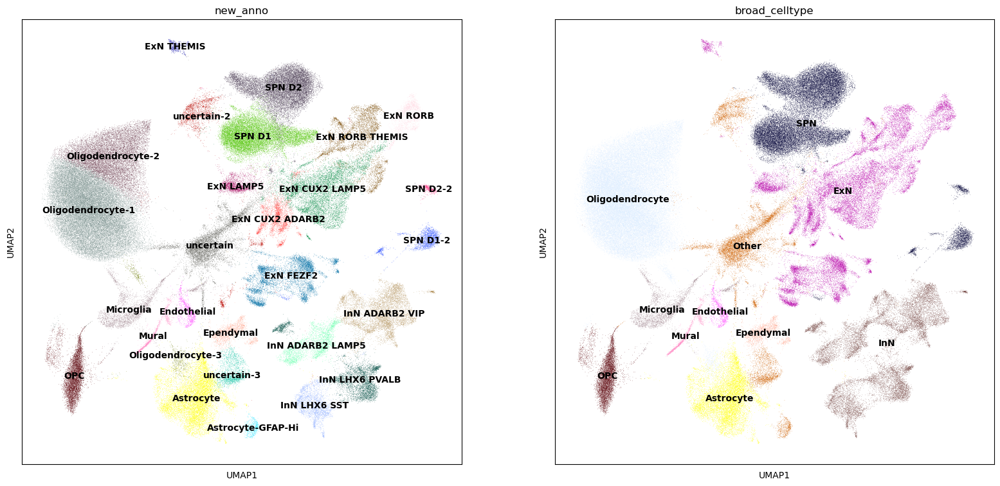

In [6]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [7]:
adata.obs.broad_celltype.value_counts()

Oligodendrocyte      50129
SPN                  33512
ExN                  28483
InN                  17733
Other                12753
Astrocyte            11289
OPC                   6682
Microglia             3265
Ependymal             1853
Mural                 1293
Endothelial            953
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

### remove cell-types that are known excludes

In [8]:
adata = adata[~adata.obs.new_anno.isin(exclude_cell_types)]
print(adata)

View of AnnData object with n_obs × n_vars = 155192 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap_085'
    varm: 'de_res', 'gmeans', 'gstds', 'means', 'pa

### replot the clusters without the excluded celltypes

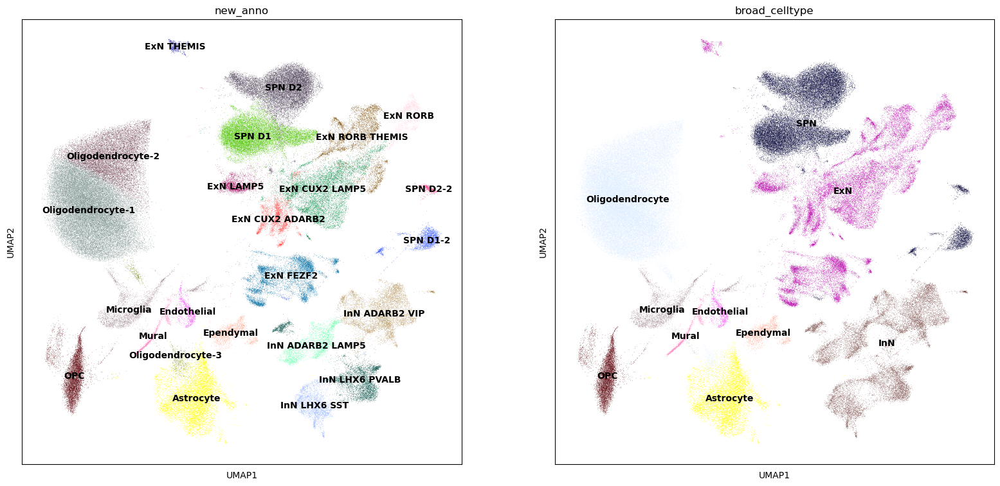

In [9]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [10]:
adata.obs.new_anno.value_counts()

Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            11289
ExN CUX2 LAMP5        9055
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
SPN D1-2              2388
ExN RORB              1966
ExN LAMP5             1963
Ependymal             1853
Mural                 1293
Endothelial            953
Oligodendrocyte-3      806
SPN D2-2               465
ExN THEMIS             461
Name: new_anno, dtype: int64

### generate density plot for brain region

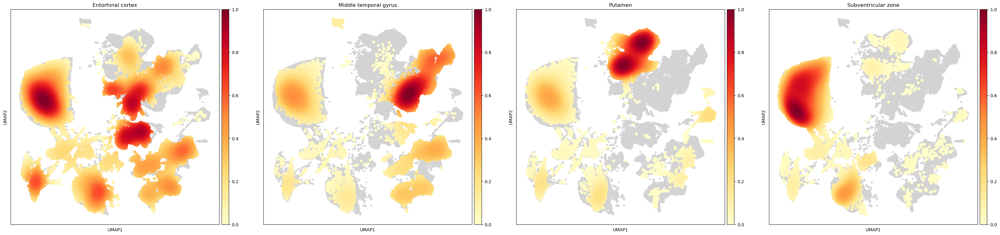

In [11]:
sc.tl.embedding_density(adata, groupby='Brain_region')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Brain_region')

### generate density plot for age group

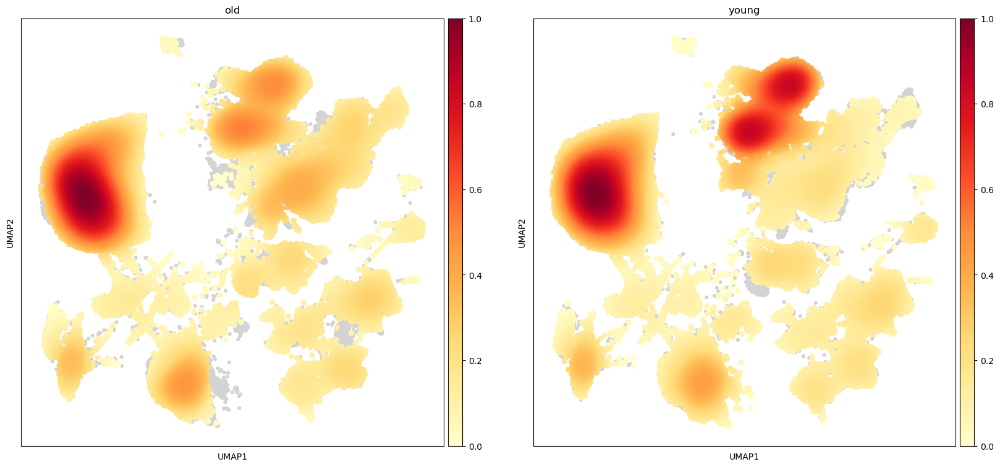

In [12]:
sc.tl.embedding_density(adata, groupby='Age_group')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Age_group')

### score the DAM

AnnData object with n_obs × n_vars = 3265 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_diffmap', 'X_f

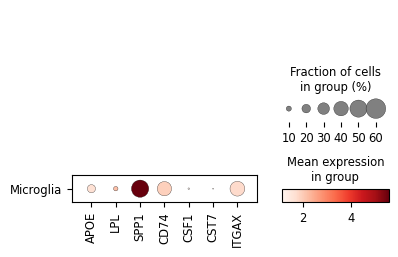

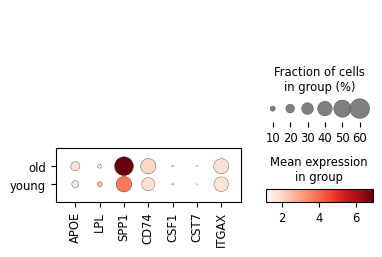

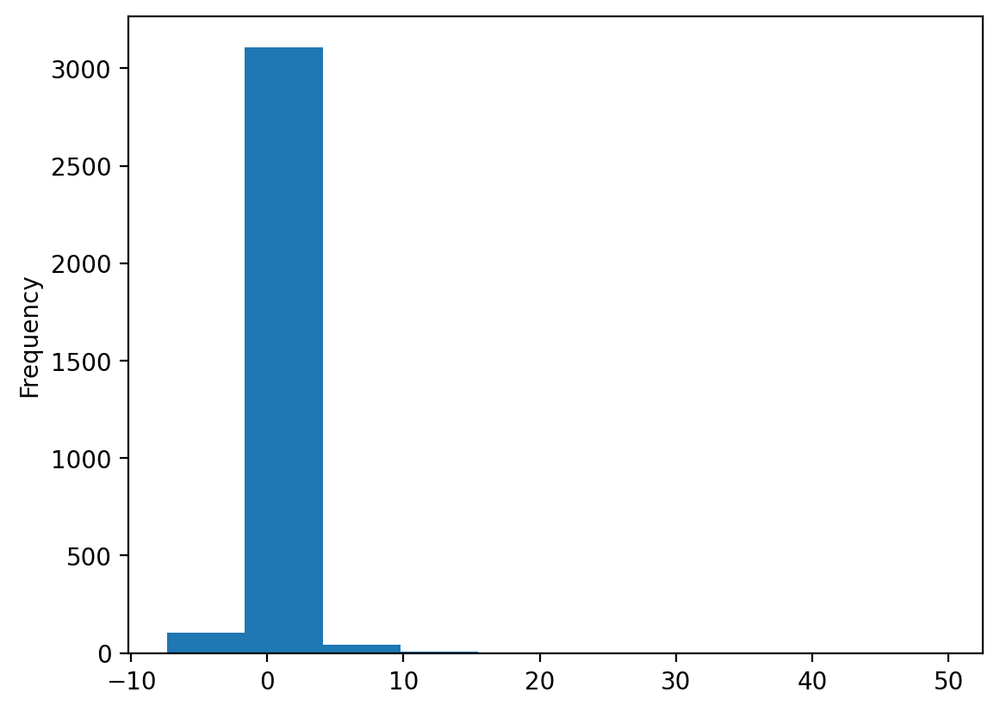

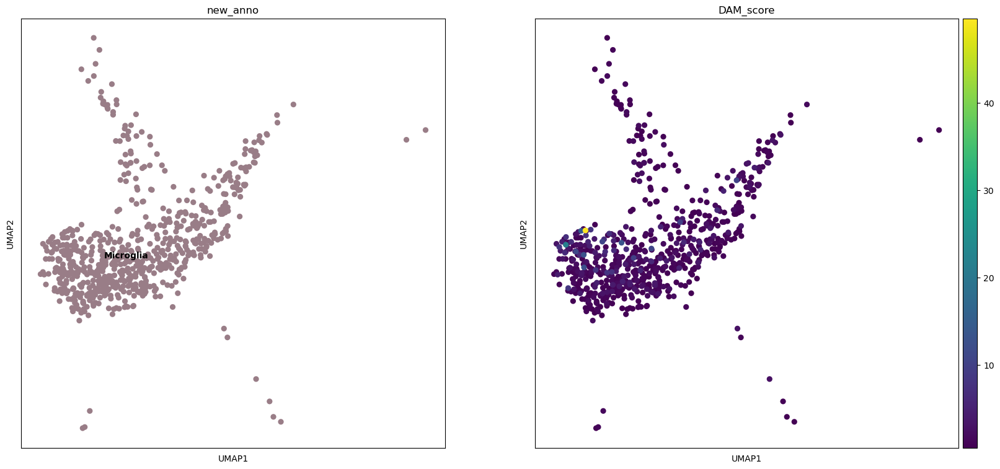

AnnData object with n_obs × n_vars = 3265 × 7
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'DAM_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_diffm

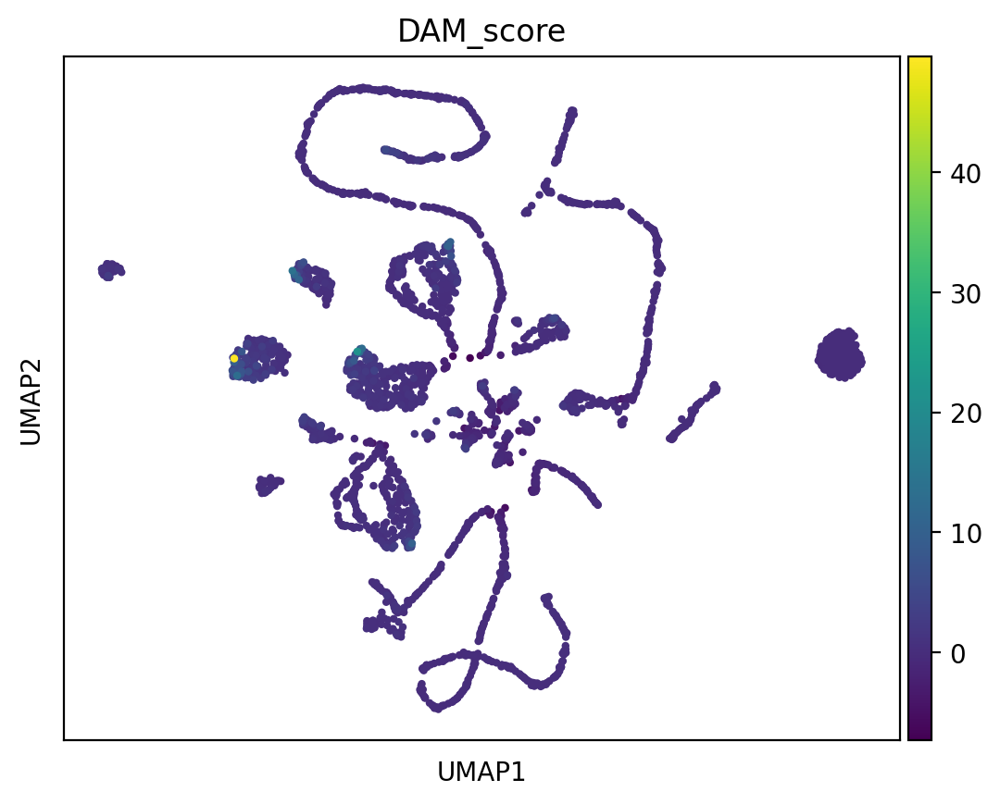

CPU times: user 31 s, sys: 790 ms, total: 31.7 s
Wall time: 15.5 s


In [13]:
%%time
mg_data = adata[adata.obs.broad_celltype == 'Microglia'].copy()
print(mg_data)
score_gene_set(mg_data, 'DAM', gene_sets['DAM'], verbose=DEBUG)

In [14]:
mg_data.obs['isDAM'] = 'notDAM'
mg_data.obs.loc[mg_data.obs.DAM_score > 0.5, 'isDAM'] = 'DAM'
display(mg_data.obs.isDAM.value_counts())

notDAM    2582
DAM        683
Name: isDAM, dtype: int64

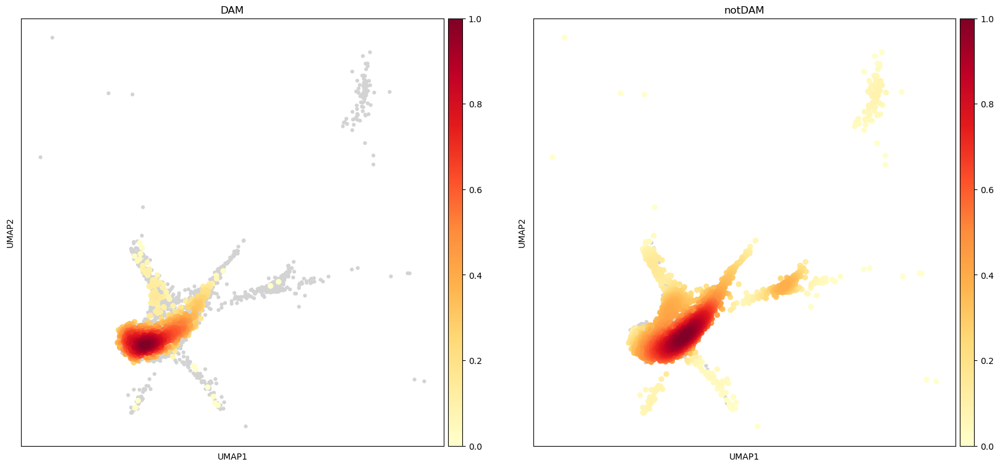

In [15]:
sc.tl.embedding_density(mg_data, groupby='isDAM')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(mg_data, groupby='isDAM')

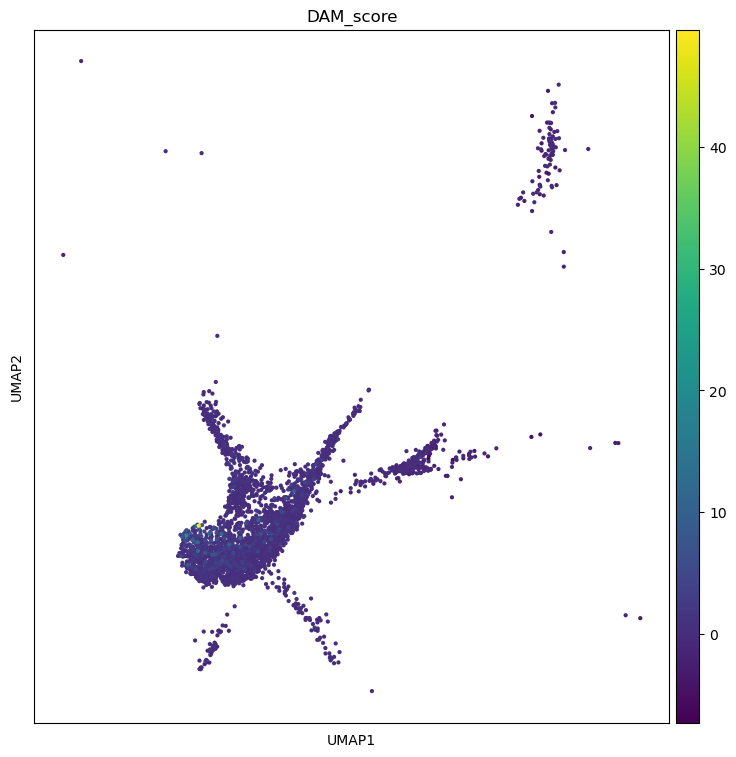

In [16]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(mg_data, color='DAM_score', legend_loc='on data')

### score the CSS, custom senescence signature

scoring CSS
Fractions of cells positive for CSS is 0.018441672251146967
visualizing.

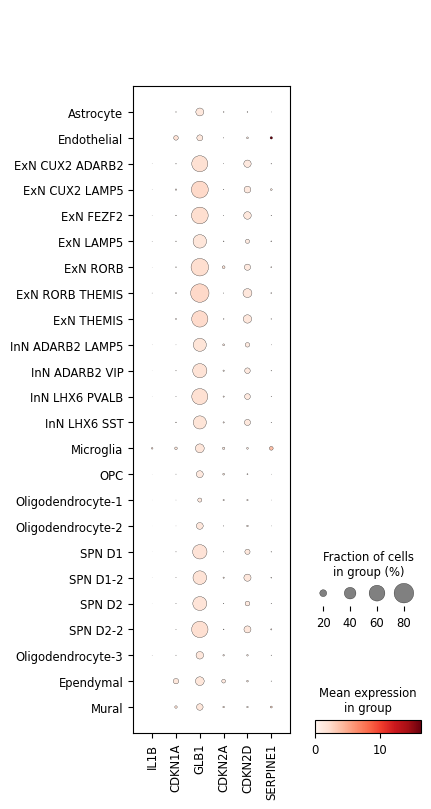

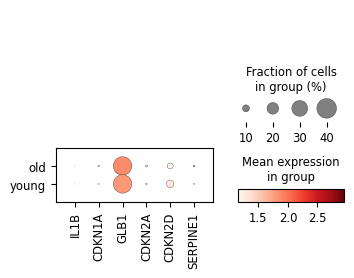

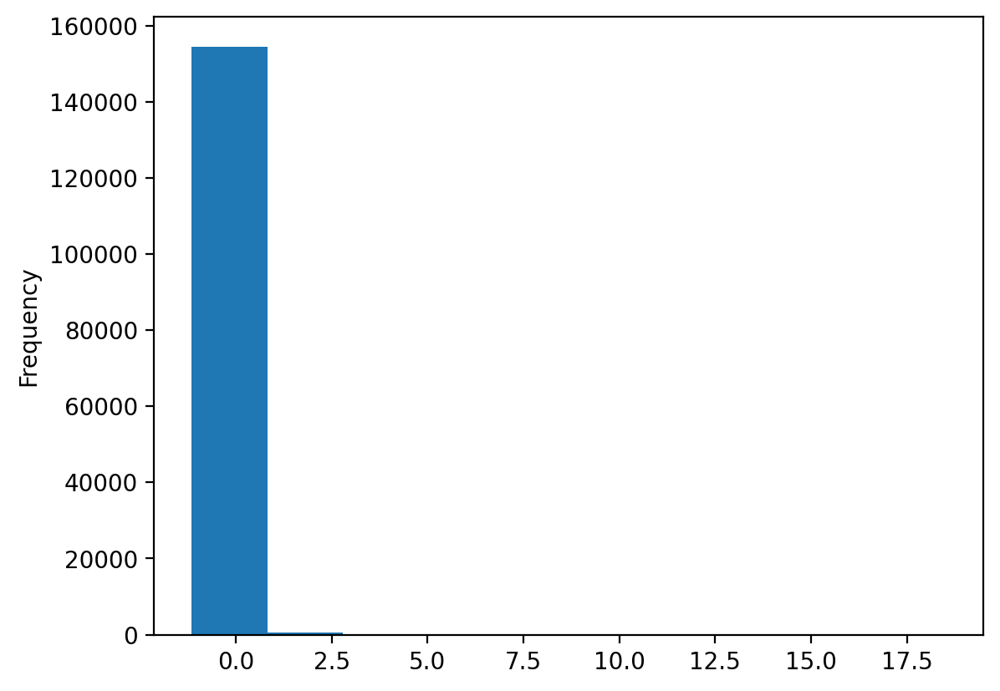

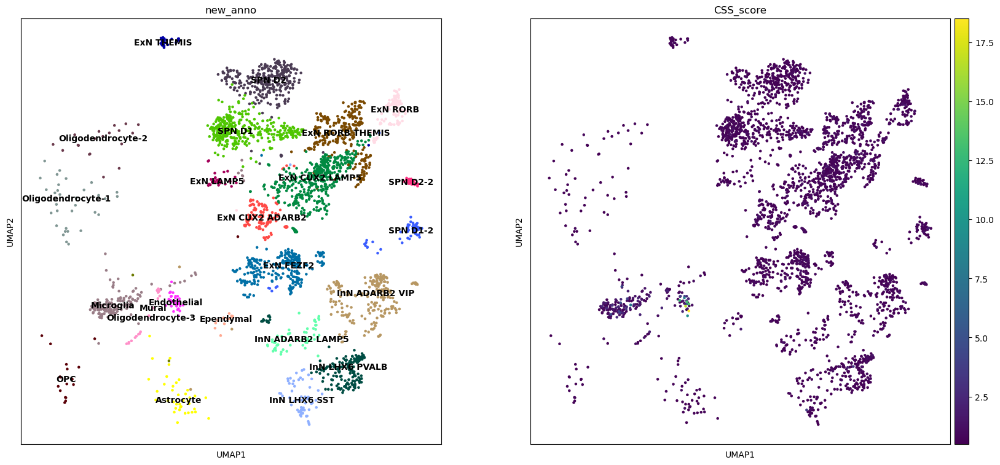

AnnData object with n_obs × n_vars = 155192 × 6
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'CSS_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_dif

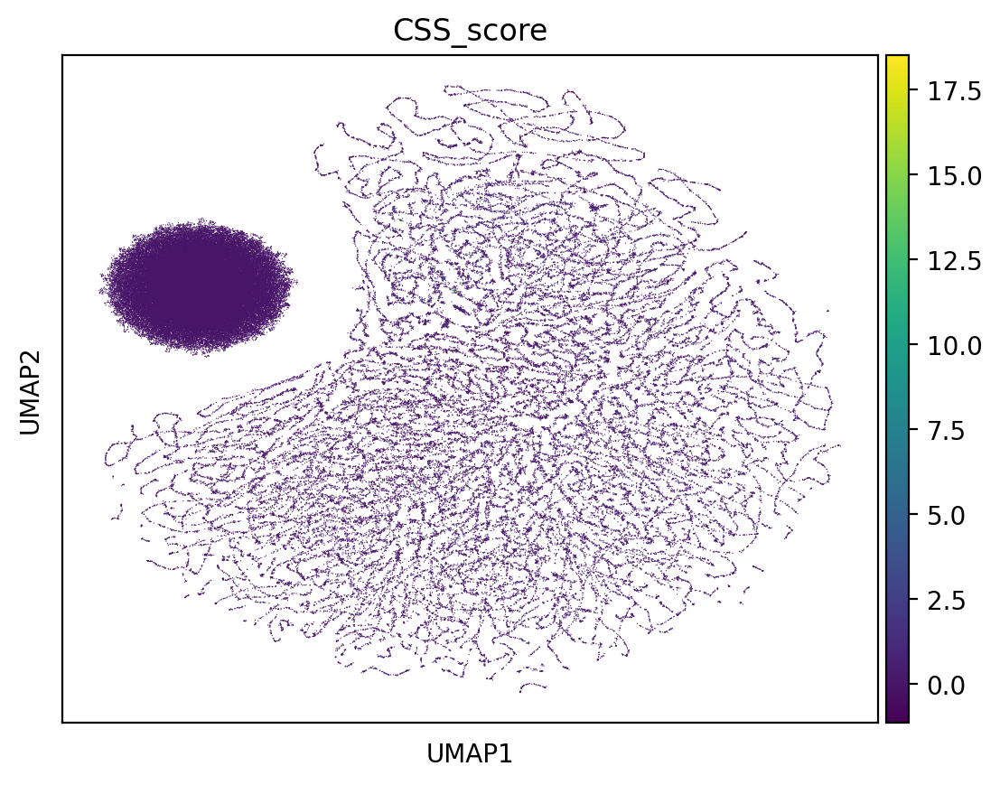

CPU times: user 19h 11s, sys: 21min 22s, total: 19h 21min 34s
Wall time: 25min 47s


In [17]:
%%time
score_gene_set(adata, 'CSS', gene_sets['CSS'], verbose=DEBUG)

### score the CSP, Canonical Senescence Pathway

scoring CSP
Fractions of cells positive for CSP is 0.0026354451260374246
visualizing.

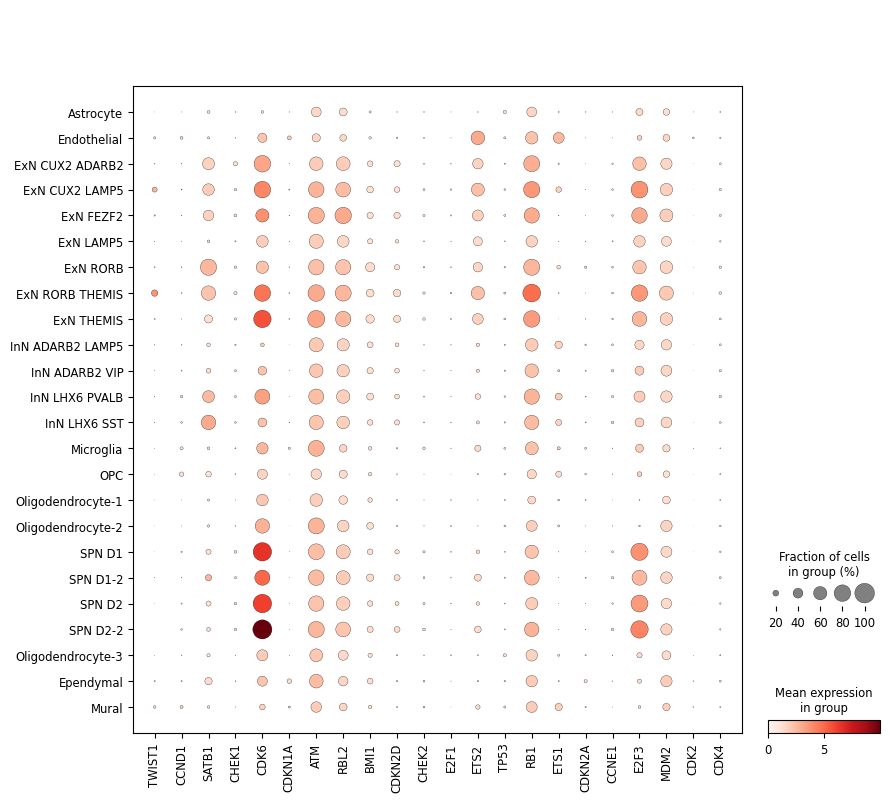

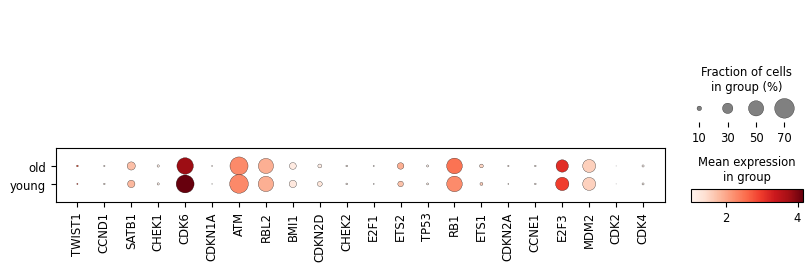

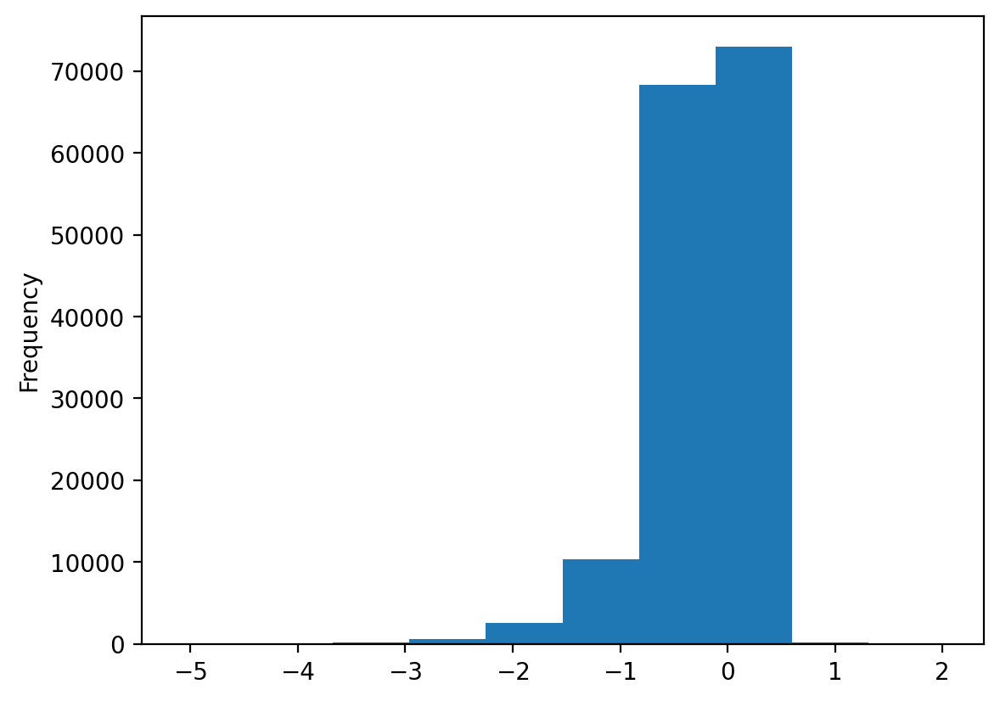

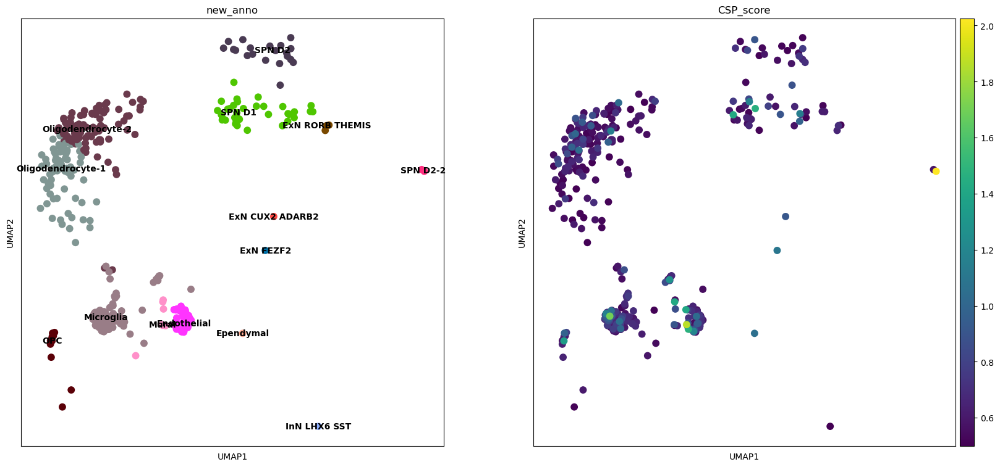

AnnData object with n_obs × n_vars = 155192 × 22
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'CSS_score', 'CSP_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
  

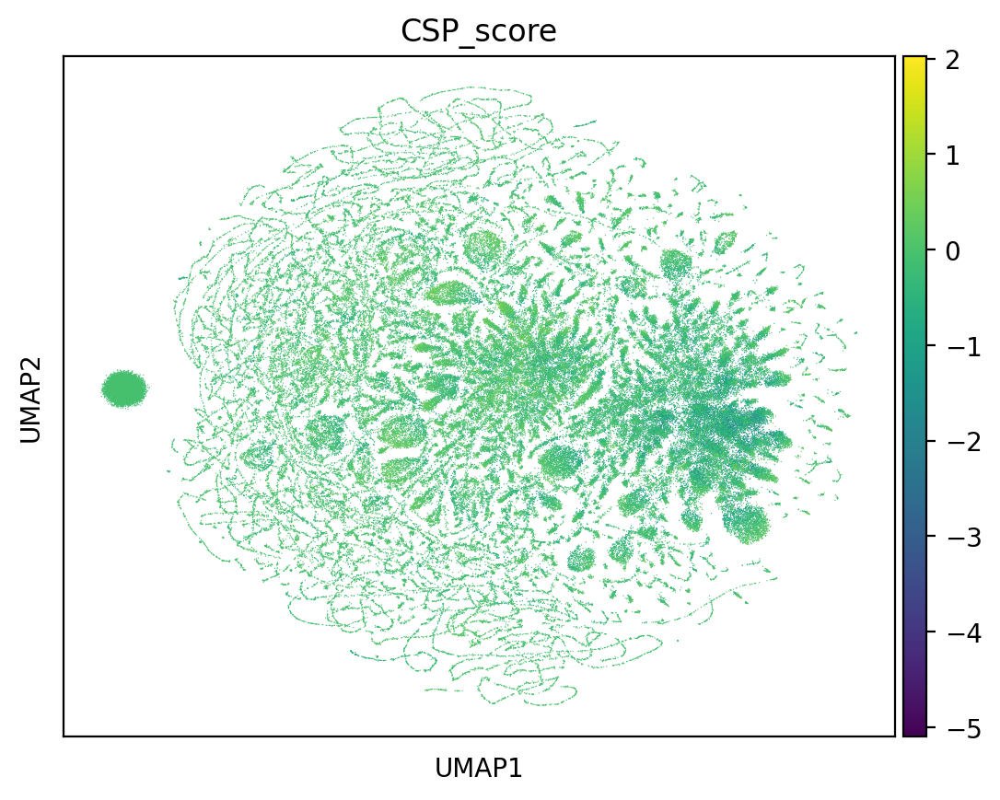

CPU times: user 1d 17h 3min 24s, sys: 46min 55s, total: 1d 17h 50min 19s
Wall time: 41min 59s


In [18]:
%%time
score_gene_set(adata, 'CSP', gene_sets['CSP'], verbose=DEBUG)

### score the SR, Senescence Responses

scoring SR
Fractions of cells positive for SR is 0.017971287179751532
visualizing.

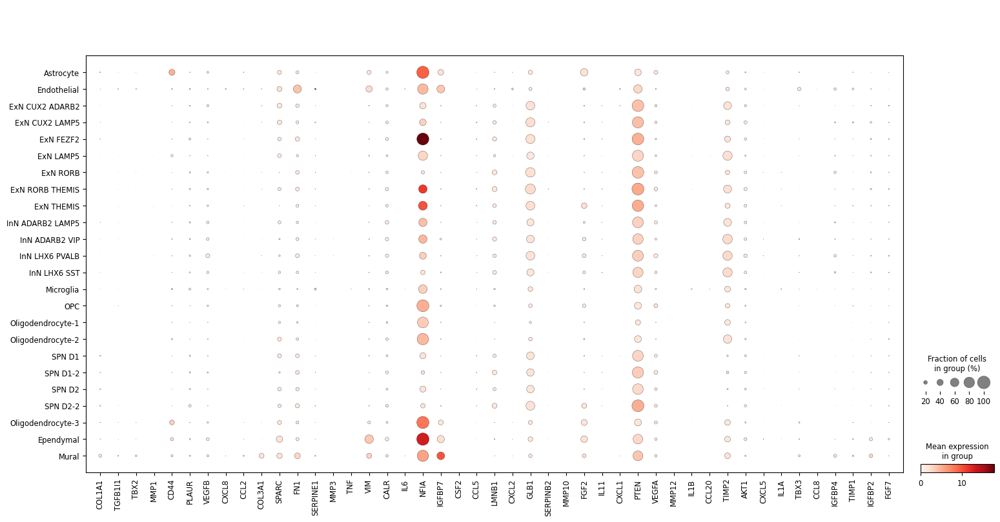

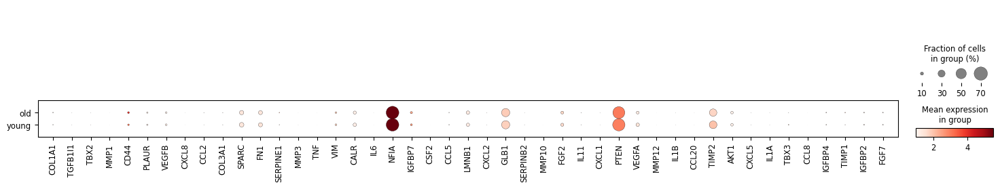

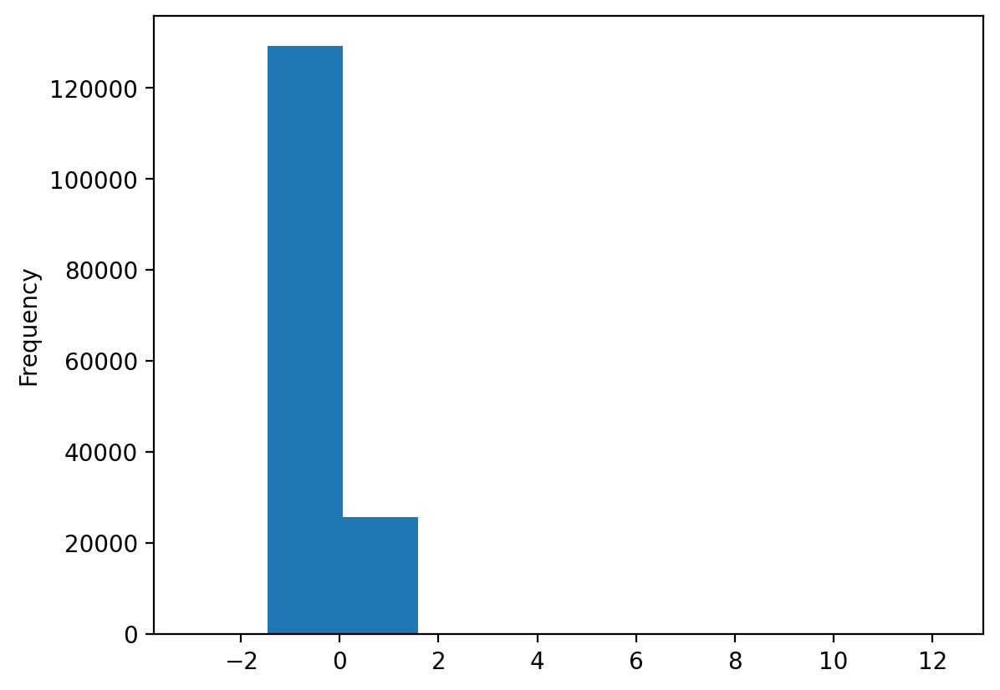

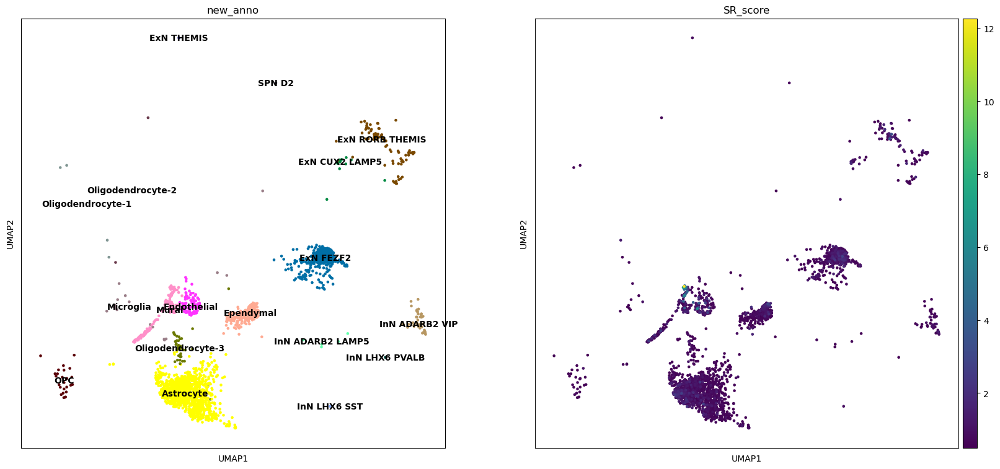

AnnData object with n_obs × n_vars = 155192 × 45
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'CSS_score', 'CSP_score', 'SR_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_grou

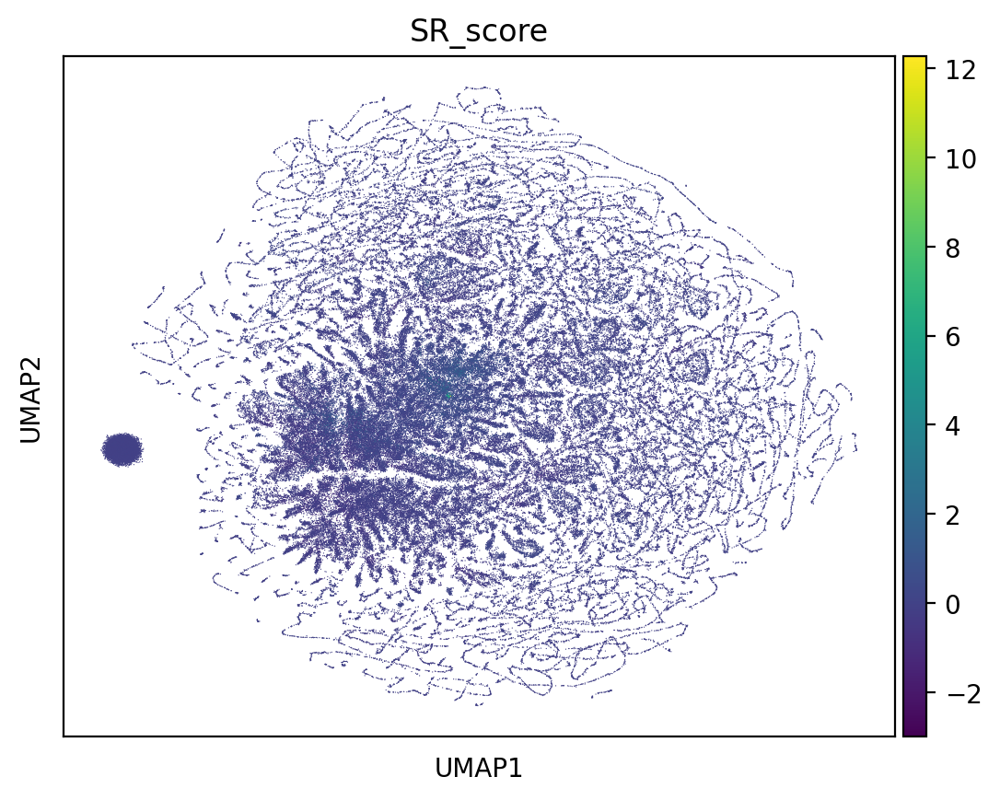

CPU times: user 20h 54min 35s, sys: 23min 16s, total: 21h 17min 51s
Wall time: 22min 43s


In [19]:
%%time
score_gene_set(adata, 'SR', gene_sets['SR'], verbose=DEBUG)

### score the SI, Senescence Initiators

scoring SI
Fractions of cells positive for SI is 0.005026032269704624
visualizing.

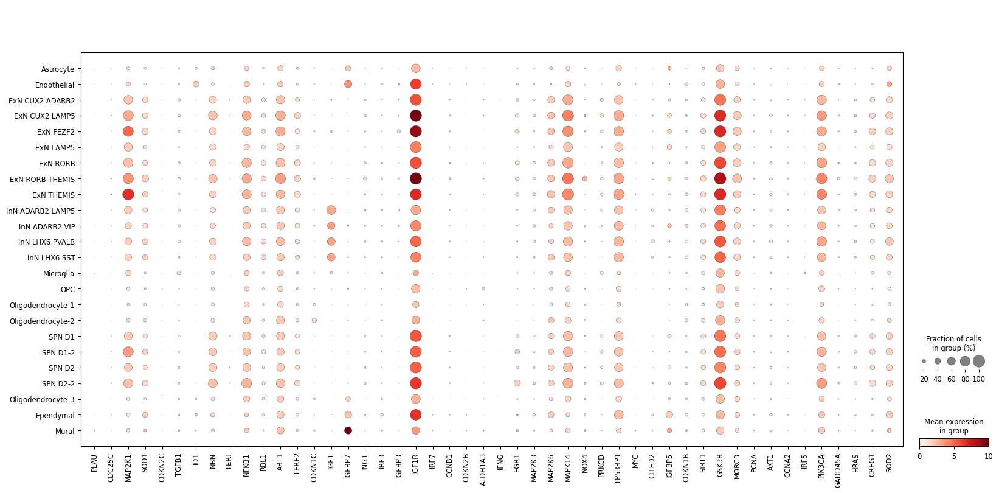

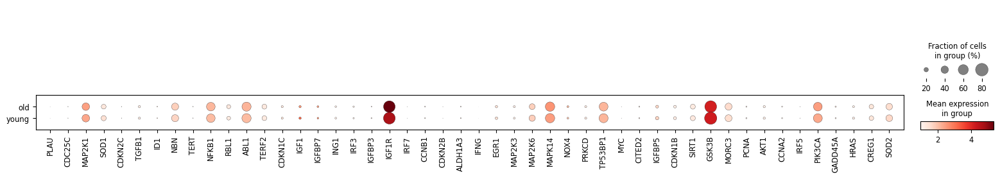

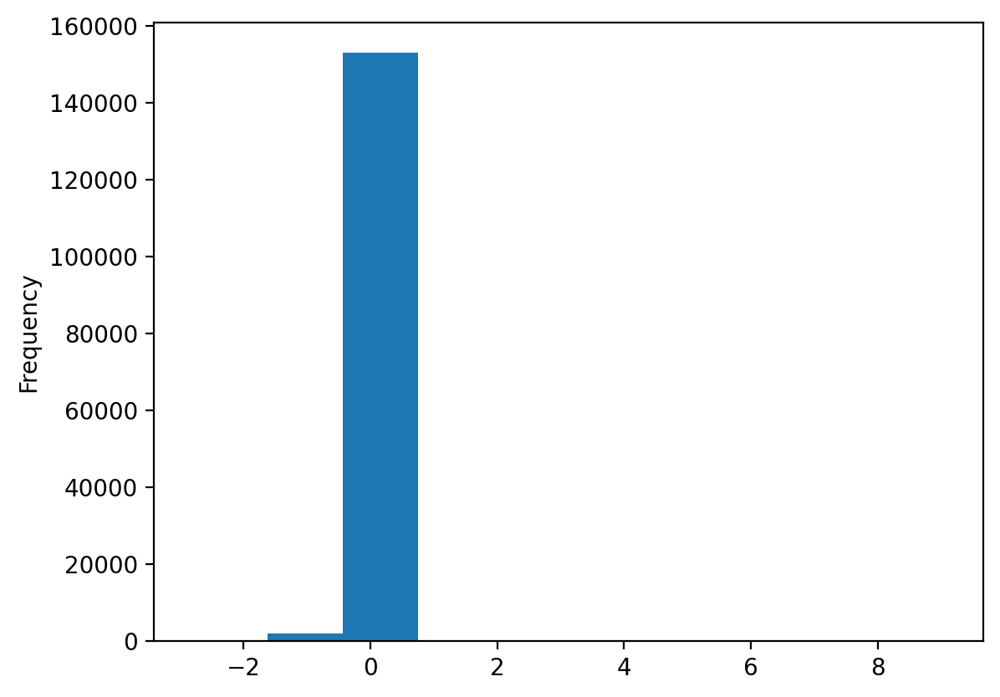

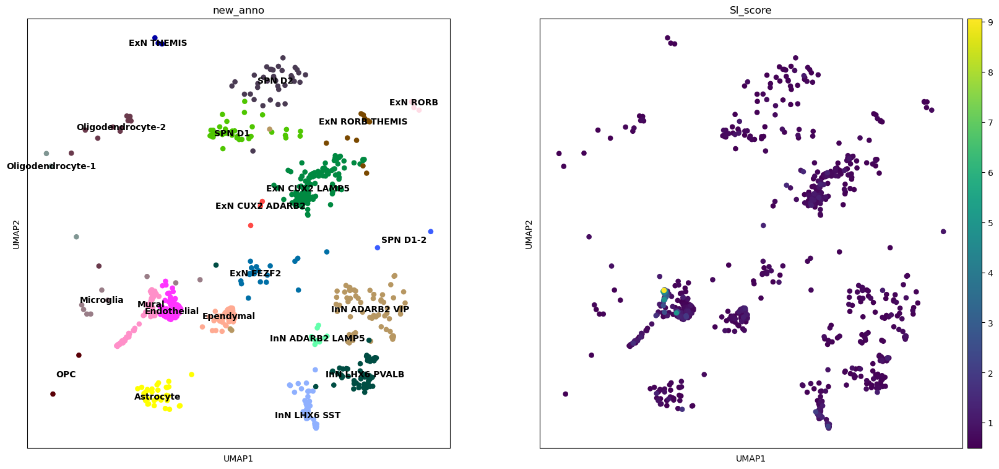

AnnData object with n_obs × n_vars = 155192 × 48
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'CSS_score', 'CSP_score', 'SR_score', 'SI_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_dens

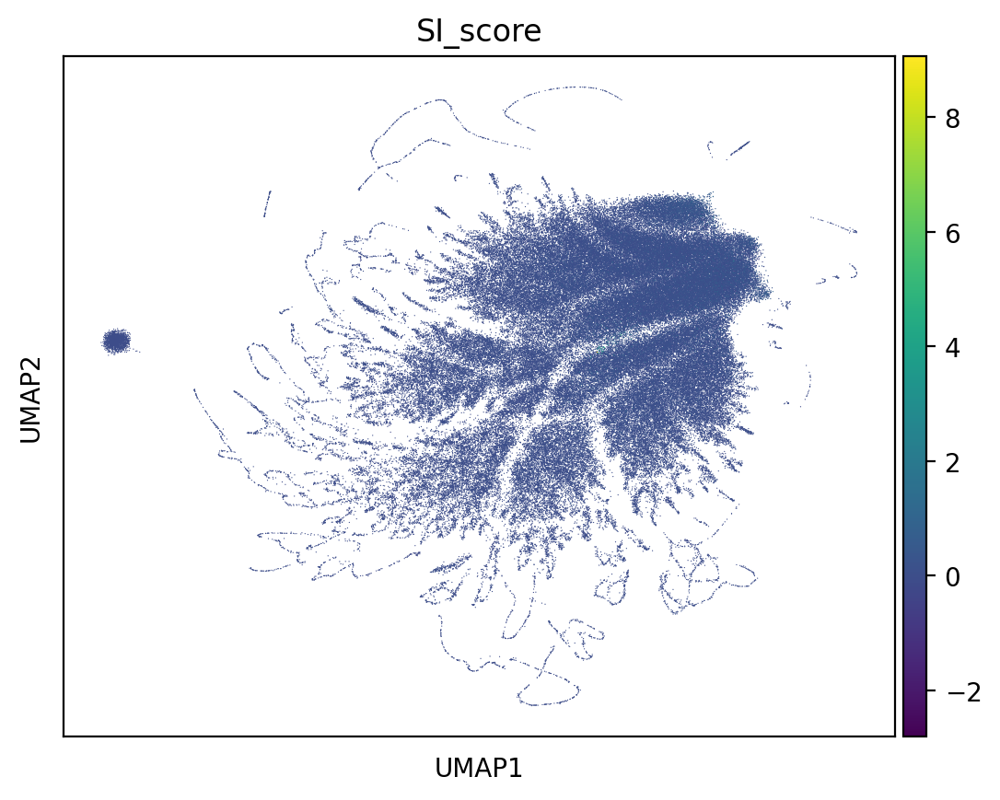

CPU times: user 2h 23min 55s, sys: 1min 17s, total: 2h 25min 13s
Wall time: 5min 17s


In [20]:
%%time
score_gene_set(adata, 'SI', gene_sets['SI'], verbose=DEBUG)

### score Senescence from all the senescence genes together

In [21]:
all_senes = []
for values in gene_sets.values():
    all_senes = all_senes + values
all_senes = list(set(all_senes))
print(len(all_senes))
print(all_senes)

124
['TBX2', 'MMP1', 'CXCL8', 'LPL', 'ID1', 'CCL2', 'ICAM', 'NFKB1', 'CDK6', 'RBL1', 'ABL1', 'CDKN1C', 'RBL2', 'LIP', 'IGFBP7', 'ING1', 'IRF3', 'CCL5', 'ALDH1A3', 'SPP1', 'MMP10', 'PRKCD', 'FGF2', 'VEGFA', 'PCNA', 'IL1A', 'COL1A1', 'TGFB1I1', 'TWIST1', 'CCND1', 'CD44', 'MAP2K1', 'VEGFB', 'SATB1', 'NBN', 'CHEK1', 'FN1', 'SPARC', 'SERPINE1', 'TNF', 'VIM', 'NFIA', 'BMI1', 'IRF7', 'LMNB1', 'CCNB1', 'CDKN2A', 'TP53BP1', 'CST7', 'CITED2', 'THBS1Ê(TSP-1)', 'CDKN1B', 'CCNE1', 'CCL20', 'TIMP2', 'CXCL5', 'CCNA2', 'CCL8', 'CDK2', 'CREG1', 'SOD1', 'PLAUR', 'TERT', 'CSF1', 'ITGAX', 'CDKN1A', 'TERF2', 'APOE', 'E2F1', 'IGF1R', 'RB1', 'CXCL2', 'GLB1', 'CDKN2B', 'ETS1', 'EGR1', 'MAP2K3', 'IL1B', 'GSK3B', 'AKT1', 'PIK3CA', 'TBX3', 'E2F3', 'MDM2', 'IGFBP2', 'FGF7', 'CDK4', 'SOD2', 'PLAU', 'CDC25C', 'CDKN2C', 'TGFB1', 'COL3A1', 'ATM', 'MMP3', 'CALR', 'IL6', 'IGF1', 'CDKN2D', 'CD74', 'GADD45A', 'IGFBP3', 'CHEK2', 'CSF2', 'ETS2', 'TP53', 'SERPINB2', 'IFNG', 'MAP2K6', 'MAPK14', 'NOX4', 'IL11', 'CXCL1', 'PTEN

scoring SA
Fractions of cells positive for SA is 0.003318470024228053
visualizing.

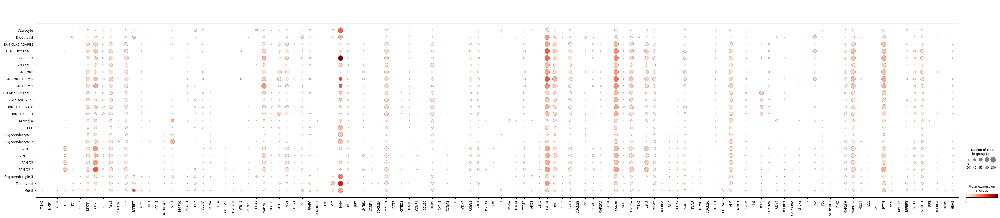

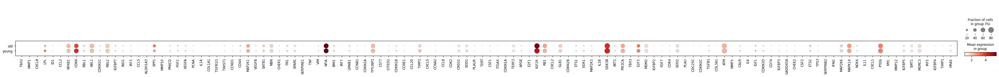

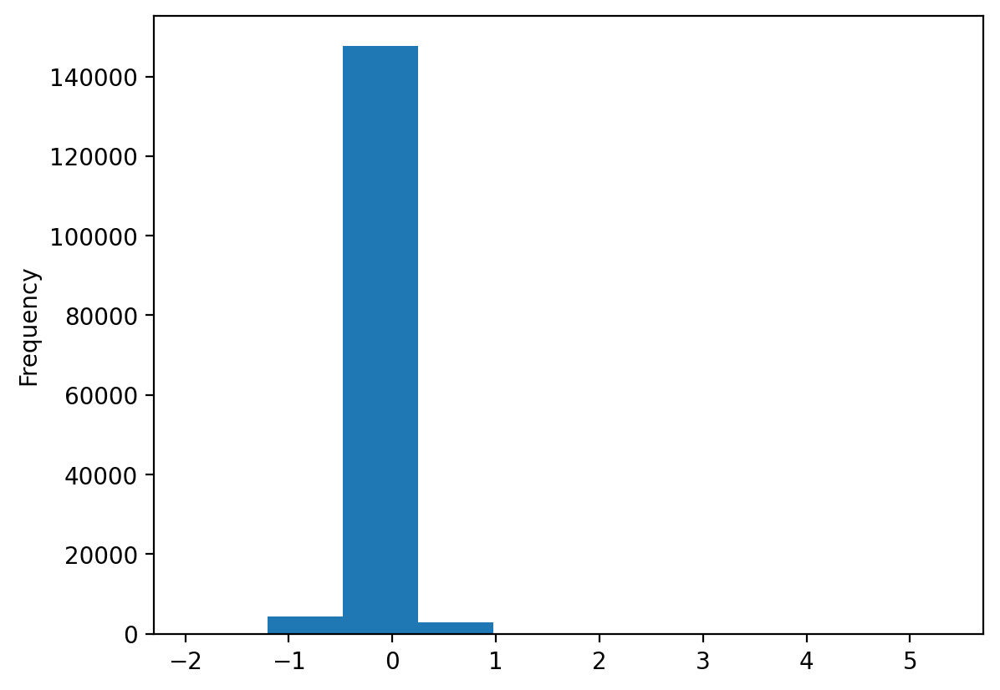

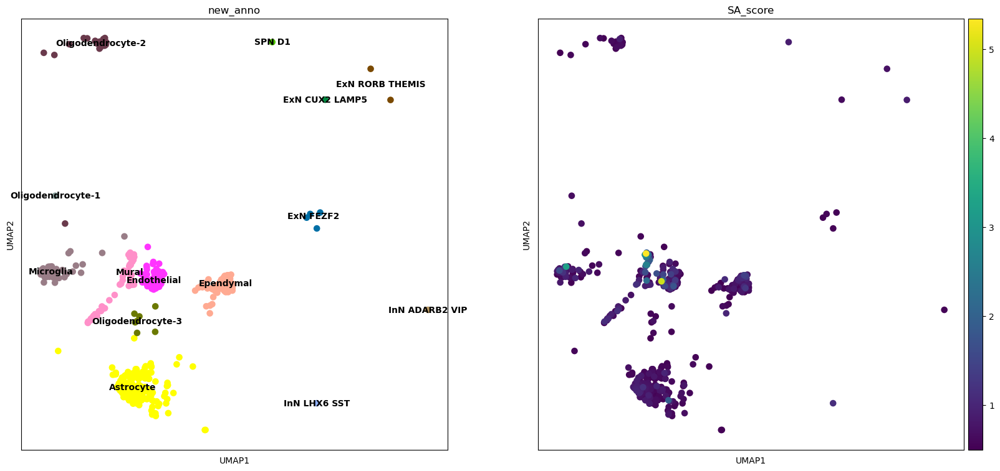

AnnData object with n_obs × n_vars = 155192 × 120
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group', 'CSS_score', 'CSP_score', 'SR_score', 'SI_score', 'SA_score'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params

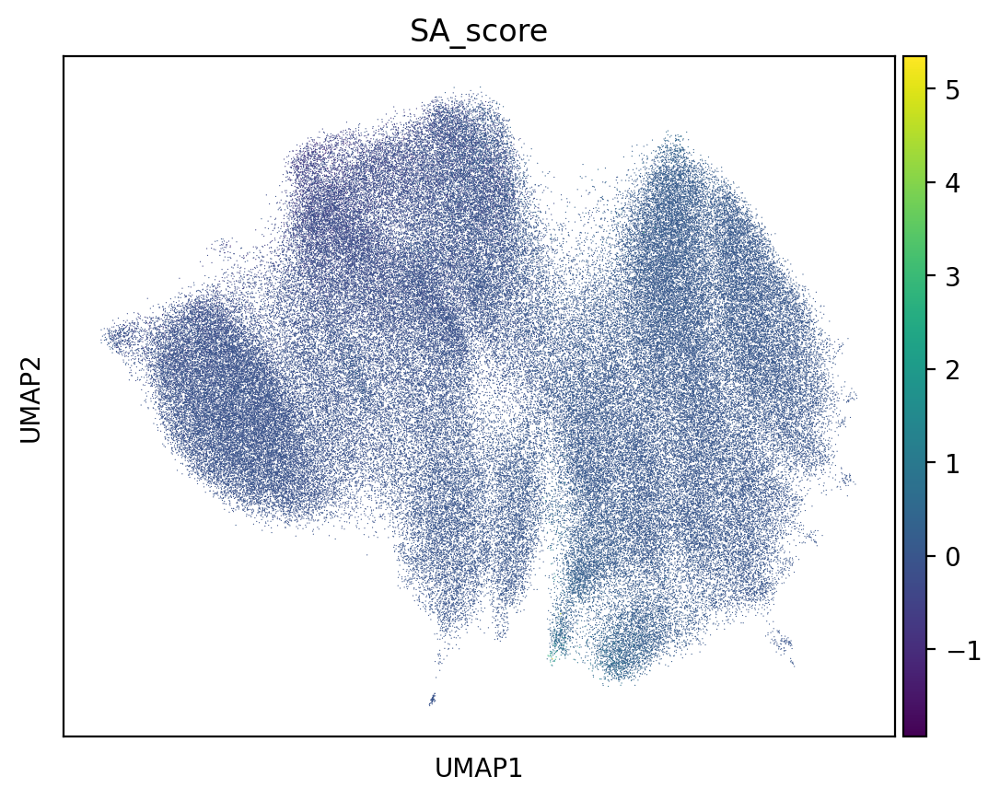

CPU times: user 29min 57s, sys: 6min 5s, total: 36min 3s
Wall time: 3min 9s


In [22]:
%%time
score_gene_set(adata, 'SA', all_senes, verbose=DEBUG)

### visualize combined Senescence scores

In [25]:
score_cols = ['CSS_score', 'CSP_score', 'SR_score', 'SI_score', 'SA_score']
other_cols = ['new_anno', 'Age_group', 'broad_celltype']
temp = adata.obs[score_cols + other_cols].copy()
print(temp.shape)
display(temp.head())

(155192, 8)


,CSS_score,CSP_score,SR_score,SI_score,SA_score,new_anno,Age_group,broad_celltype
barcodekey,,,,,,,,
AAACCCACAGTTGGTT-1,1.004000,-0.634052,-0.566315,-0.130436,-0.367817,ExN CUX2 LAMP5,young,ExN
AAACCCATCTCGCTTG-1,-0.057333,-0.577812,-0.270675,-0.081636,-0.194561,ExN CUX2 LAMP5,old,ExN
AAACGAACACGGTAGA-1,-0.100000,0.026194,-0.052461,-0.053276,-0.013947,Oligodendrocyte-1,young,Oligodendrocyte
AAACGCTAGAACTCCT-1,-0.225333,-0.436826,-0.752602,-0.335990,-0.375453,ExN CUX2 LAMP5,old,ExN
AAACGCTAGTCAGCCC-1,-0.090667,-0.666410,-0.752954,0.336310,-0.135042,ExN CUX2 LAMP5,old,ExN


In [32]:
from umap import UMAP

def plot_umap_clusters(umap_df, hue_cov=None, style_cov=None, size_cov=None):
    with rc_context({'figure.figsize': (8, 8), 'figure.dpi': 50}):
        plt.style.use('seaborn-bright')
        sns_plot = scatterplot(x='x_umap',y='y_umap', 
                                   hue=hue_cov, style=style_cov, size=size_cov, 
                                   data=umap_df, palette='viridis')
        plt.xlabel('x-umap')
        plt.ylabel('y-umap')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, 
                   borderaxespad=0,prop={'size': 10})
        plt.show()
        
def generate_umap_covs_df(this_df, other_covs_df=None, 
                             rnd_digits=3, merge_input=False):
    #run UMAP on the data frame features
    umap_results = UMAP(random_state=42).fit_transform(this_df)
    umap_df = DataFrame(umap_results,columns=['x_umap','y_umap'],
                                       index=this_df.index).round(rnd_digits)
    if merge_input:
        umap_df = umap_df.merge(this_df,left_index=True,right_index=True)
    if other_covs_df is not None:
        umap_df = umap_df.merge(other_covs_df, how='left', 
                                left_index=True, right_index=True)
    print(f'The dimensions of the umap df and the traits are {umap_df.shape}')
    return umap_df        

In [41]:
%%time
umap_df = generate_umap_covs_df(temp[score_cols], temp)

The dimensions of the umap df and the traits are (155192, 10)
CPU times: user 27min 26s, sys: 5min 23s, total: 32min 49s
Wall time: 2min 16s


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


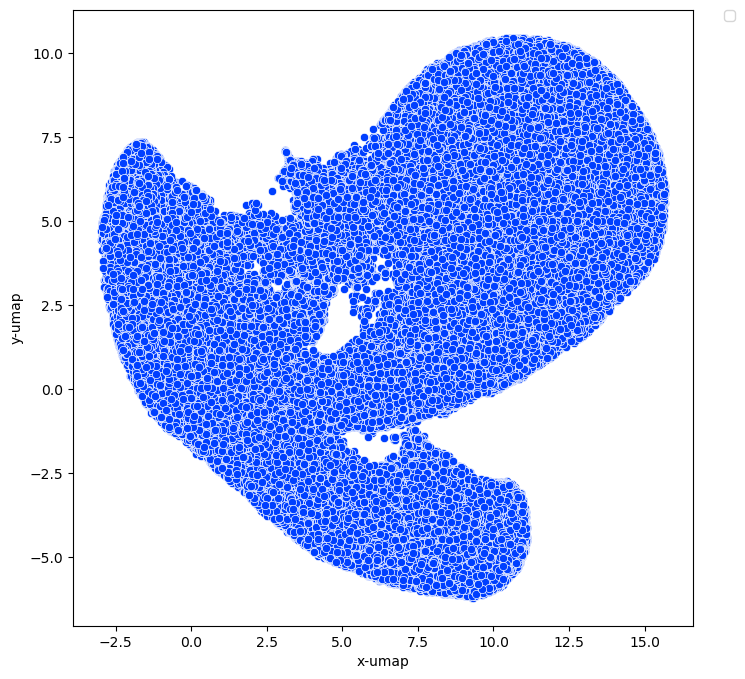

CPU times: user 360 ms, sys: 10 ms, total: 370 ms
Wall time: 367 ms


In [42]:
%%time
plot_umap_clusters(umap_df)

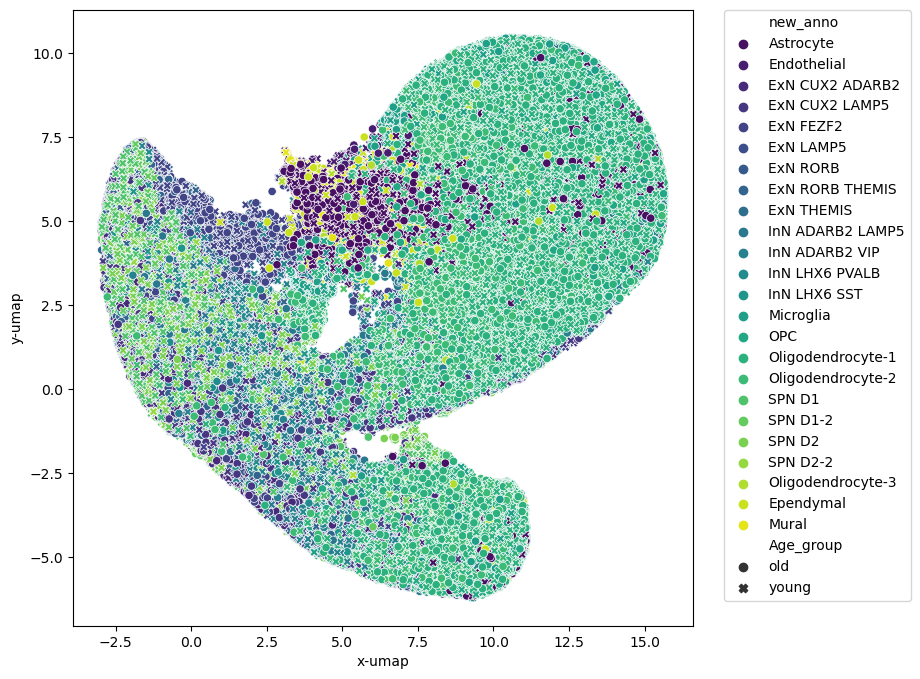

In [43]:
plot_umap_clusters(umap_df, hue_cov='new_anno', style_cov='Age_group')

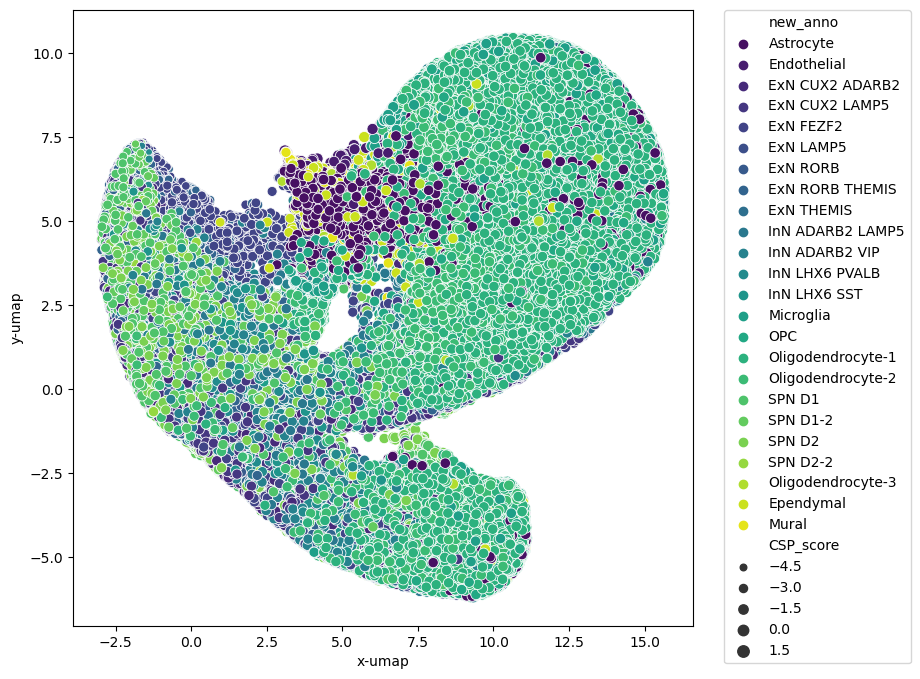

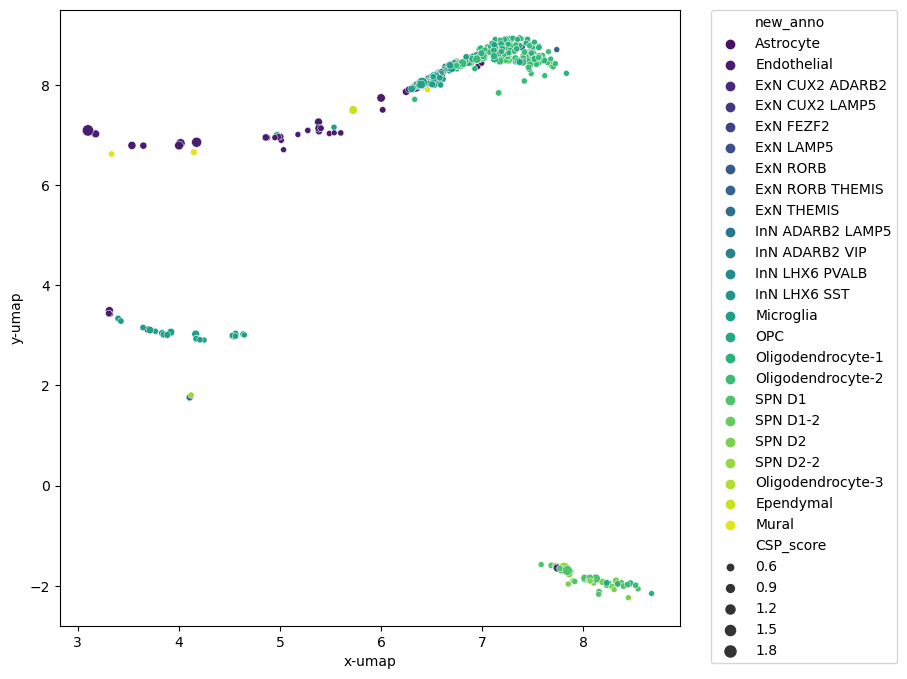

In [46]:
plot_umap_clusters(umap_df, hue_cov='new_anno', size_cov='CSP_score')
plot_umap_clusters(umap_df.loc[umap_df.CSP_score >= 0.5], hue_cov='new_anno', 
                   size_cov='CSP_score')

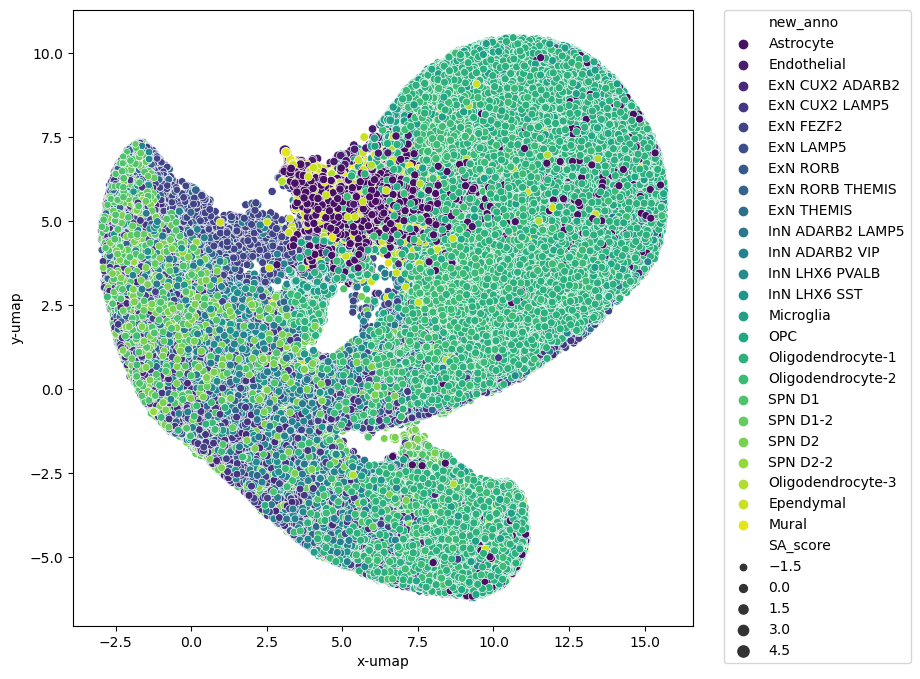

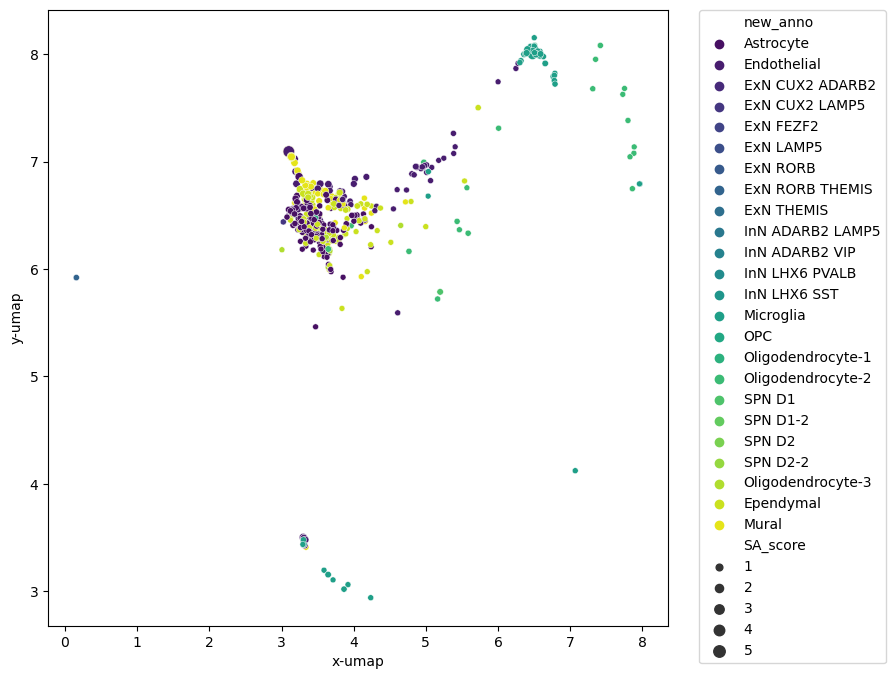

In [47]:
plot_umap_clusters(umap_df, hue_cov='new_anno', size_cov='SA_score')
plot_umap_clusters(umap_df.loc[umap_df.SA_score >= 0.5], hue_cov='new_anno', 
                   size_cov='SA_score')